# BWL: Produktion und Logistik - Layoutplanung

Dieses Jupyter Notebook ergänzt die Inhalte der Vorlesung und bietet Ihnen die Möglichkeit, das **Quadratic Assignment Problem (QAP)** interaktiv kennenzulernen.  
Es setzt die theoretischen Konzepte schrittweise in Python um und zeigt, wie sich das Problem sowohl exakt mit einem Open-Source MIP Solver als auch heuristisch mit dem Zweiertauschverfahren lösen lässt.

Das Notebook ist in vier Teile gegliedert:

1. **Erstellen von QAP-Probleminstanzen**  
2. **Modellierung und Lösung des QAP mit dem Open-Source MIP Solver SCIP**  
3. **Lösung des QAP mit dem Zweiertauschverfahren**  
4. **Vergleich beider Ansätze (SCIP vs. Zweiertauschverfahren)**  

> 💡 Hinweis:
> Das Notebook dient ausschließlich Ihrem Verständnis – **Python-Code wird in der Prüfung nicht abgefragt.**

## Setup
### Installation externer Bibliotheken

Wir nutzen im Folgenden den MIP Solver **SCIP** über die Python-Schnittstelle `pyscipopt`.  
Falls das Paket auf dem aktuellen System noch nicht vorhanden ist, kann es mit dem folgenden Befehl installiert werden.

Für mehr Informationen zu SCIP, siehe: https://scipopt.org/ 

> 💡 Hinweis: 
> Die Installation muss **nur einmal pro Umgebung** erfolgen.  


In [2]:
# Installation der Python-Schnittstelle für den SCIP-Solver.
# (Nur einmal erforderlich; ggf. in neuen Umgebungen wiederholen)
!pip install pyscipopt

### Import benötigter Python-Bibliotheken

In diesem Abschnitt werden alle Bibliotheken importiert, die wir für das Notebook benötigen:

- **Standardmodule**: `time` zur Zeitmessung.  
- **Numerik & Datenanalyse**: `numpy` und `pandas` für Matrizen und tabellarische Auswertungen.  
- **Visualisierung**: `matplotlib.pyplot` für Diagramme.  
- **Optimierung**: `pyscipopt` als Python-Schnittstelle zu SCIP.  

Alle weiteren Codeblöcke bauen auf diesen Imports auf.


In [3]:
# --- Basis-Setup: Bibliotheken & Tools für das Notebook ---------------------
import numpy as np                    # Arrays und Matrizenoperationen
import matplotlib.pyplot as plt       # Grafische Auswertung und Plots
import pandas as pd                   # Tabellen (Datenframes) für strukturierte Ergebnisse
from pyscipopt import Model, quicksum  # Modellierung und Summationshilfe für lineare / quadratische Ausdrücke
from time import perf_counter


## Teil 1: Erstellen von QAP-Probleminstanzen

Bevor wir das **Quadratic Assignment Problem (QAP)** lösen können, brauchen wir zunächst **Probleminstanzen**, also konkrete Datensätze für die Modellparameter.  
Dazu erstellen wir im Folgenden eine Klasse, mit der wir solche Instanzen in beliebiger Größe automatisch erzeugen können.

### Schritt 1: Instanzobjekt als Klasse

Die Klasse `QAPInstance` beschreibt den Aufbau einer QAP-Probleminstanz.  
Beim Erzeugen eines Objekts (z. B. `QAPInstance(n_objects=9)`) werden automatisch das **Layout**,  
die zugehörige **Distanzmatrix** sowie eine **Warenaustauschshäufigkeitsmatrix** generiert.

Letztere kann auch vorgegeben werden, wenn Sie ein konkretes Beispiel – etwa das aus der Vorlesung – abbilden möchten.  
Im Folgenden basiert die Distanzmatrix basiert immer auf **Manhattan-Distanzen** in einem quadratischen Layout, sodass sich das Vorlesungsbeispiel direkt einfügt. Das muss natürlich nicht in allen realen Problemen so der Fall sein. Falls Sie Beispiele mit eigens gewählten Distanzmatrizen generieren wollen, überlegen Sie, wie Sie die untenstehende Klasse entsprechend erweitern können. 

Damit dient `QAPInstance` als **Generator für QAP-Probleminstanzen** und erlaubt, beliebig viele Testinstanzen mit einer definierten Anzahl an Anordnungsobjekten automatisch zu erzeugen und zu visualisieren.

In [6]:
class QAPInstance:
    """Einfacher Generator für QAP-Beispiele mit quadratischen Layout."""

    def __init__(self, n_objects=None, flow_matrix = None, seed=None):
        """
        Erstellt ein quadratisches Layout mit genügend Positionen für n_objects.
        
        Parameter
        ----------
        n_objects : int
            Anzahl der Anordnungsobjekte.
        flow_matrix : np.ndarray, optional
            Vorhandene Warenaustauschhäufigkeitsmatrix (h_ij). Wenn None, wird eine zufällige Matrix generiert.
        seed : int, optional
            Zufallszahlensamen (für spätere Erweiterungen).
        """
        if not isinstance(n_objects, int) or n_objects <= 0:
            raise ValueError("n_objects muss eine positive ganze Zahl sein.")

        self.n_objects = n_objects
        self.flow_matrix = flow_matrix
        self.rng = np.random.default_rng(seed)
        self.scale = 10  # Meter pro Rastereinheit
        
        # kleinstes Quadrat bestimmen, das alle Objekte aufnehmen kann (ggf. mit Dummy-Positionen)
        self.rows = int(np.ceil(np.sqrt(n_objects)))
        self.cols = self.rows
        self.n_positions = self.rows * self.cols

        # Gitterkoordinaten (Positionen)
        xs, ys = np.meshgrid(range(self.cols), range(self.rows))
        self.positions = np.c_[xs.ravel(), ys.ravel()]
        
        # Manhattan-Distanzen (in Metern) zwischen allen Positionen → d_kl im QAP
        self.distance_matrix = self._compute_manhattan_distances() * self.scale  

        # Zufällige Warenaustauschhäufigkeiten (nur zwischen "echten" Objekten, nicht den aufgefüllten Positionen)
        if self.flow_matrix is None:
            self.flow_matrix = self._generate_flow_matrix()  # h_ij
        
    def _compute_manhattan_distances(self):
        """Berechnet Manhattan-Distanzen zwischen allen Positionen."""
        diff = np.abs(self.positions[:, None, :] - self.positions[None, :, :])
        return diff.sum(axis=2)
    
    def _generate_flow_matrix(self):
        """Erzeugt zufällige Warenaustauschhäufigkeiten zwischen Objekten."""
        H = np.zeros((self.n_positions, self.n_positions))
        # nur oberes linkes Teilquadrat (n_objects x n_objects) füllen
        sub = self.rng.integers(low=5, high=50, size=(self.n_objects, self.n_objects))
        np.fill_diagonal(sub, 0)  # keine Selbstflüsse
        H[:self.n_objects, :self.n_objects] = sub
        return H
    
    def plot_layout(self, assignment=None, object_names=None):
        """
        Visualisiert das Grid. Optional mit Zuordnung:
        - assignment: {i: k}  (Objekt i -> Position k) ODER Liste [pos_of_obj0, pos_of_obj1, ...]
        - object_names: Liste von Strings für AOs (len = n_objects). Default: "AO 1", "AO 2", ...
        """

        # Objekt-Namen
        if object_names is None:
            object_names = [f"AO {i+1}" for i in range(self.n_objects)]

        # assignment in Dict-Form {obj i -> pos k} bringen
        obj2pos = None
        if assignment is not None:
            if isinstance(assignment, dict):
                obj2pos = {int(i): int(k) for i, k in assignment.items()}
            else:  # z. B. Liste/Array: index = Objekt i, Wert = Position k
                obj2pos = {int(i): int(k) for i, k in enumerate(assignment)}

        # Map Position -> Objektname (falls zugeordnet)
        pos2name = {}
        if obj2pos is not None:
            for i, k in obj2pos.items():
                if 0 <= i < self.n_objects and 0 <= k < self.n_positions:
                    pos2name[k] = object_names[i]

        # Zeichnen
        if self.n_objects <= 16:
            plt.figure(figsize=(4, 4))
        else:
           plt.figure(figsize=(8, 8)) 
        for pos_idx, (x, y) in enumerate(self.positions):
            p_label = f"P{pos_idx+1}"
            if pos_idx in pos2name:
                label = f"{p_label}: {pos2name[pos_idx]}"
            else:
                label = p_label
            plt.text(x, y, label, ha="center", va="center", fontsize=9, fontweight="bold")

        # Fester Rahmen passend zu rows/cols
        plt.xlim(-0.5, self.cols - 0.5)
        plt.ylim(-0.5, self.rows - 0.5)
        plt.gca().invert_yaxis()
        plt.gca().set_aspect("equal", adjustable="box")
        plt.grid(True, linestyle="--", linewidth=0.5)
        plt.title("Grid Layout" if assignment is None else "Grid Layout (mit Zuordnung)", pad=10)
        # keine Ticks/Beschriftungen
        plt.xticks([]); plt.yticks([])
        plt.show()

    def plot_flow_heatmap(self, only_objects=True):
        """Zeigt die Warenaustauschhäufigkeiten als kompakte Heatmap mit Integer-Farbskala."""
        F = self.flow_matrix[:self.n_objects, :self.n_objects] if only_objects else self.flow_matrix

        # negative Werte verhindern (sollten ohnehin nicht vorkommen)
        F = np.maximum(F, 0)
        im = plt.imshow(F, cmap="Blues", aspect="equal")

        # Colorbar mit Integer-Ticks
        cbar = plt.colorbar(im, shrink=0.8)
        cbar.set_label("Warenaustauschhäufigkeit", rotation=270, labelpad=12)
        cbar.set_ticks(np.arange(int(np.min(F)), int(np.max(F)) + 1,
                                step=max(1, (np.max(F) - np.min(F)) // 5 or 1)))

        # Titel und Achsenbeschriftungen
        plt.title("Häufigkeit (H)")
        plt.xlabel("Zu Objekt j")
        plt.ylabel("Von Objekt i")

        # Achsenticks beginnen bei 1 (statt 0)
        n = F.shape[0]
        plt.xticks(range(n), [str(i + 1) for i in range(n)])
        plt.yticks(range(n), [str(i + 1) for i in range(n)])

        plt.tight_layout()
        plt.show()

### Schritt 2: Erzeugen der Beispielinstanz aus der Vorlesung

Im nächsten Schritt betrachten wir die konkrete **Beispielinstanz aus der Vorlesung**. Dabei sind die **Warenaustauschhäufigkeiten** zwischen den vier Anordnungsobjekten vorgegeben. Diese übergeben wir in der `flow_matrix` beim Erzeugen des `QAPInstance`-Objekts. Die Häufigkeiten werden somit nicht zufällig generiert, sondern **gemäß den Vorlesungsdaten** festgelegt.

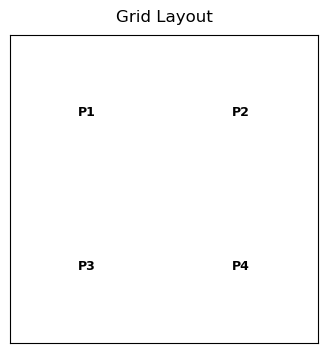

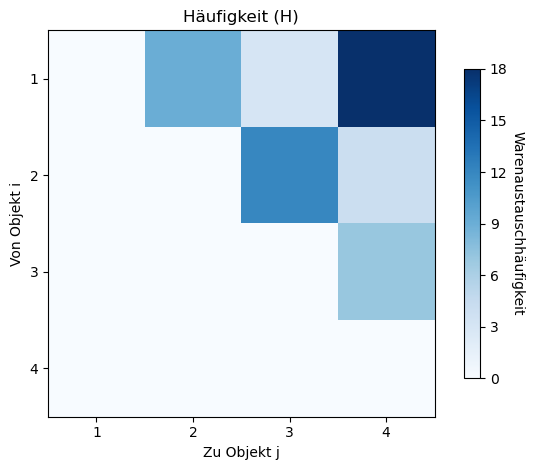

In [7]:
# Beispielinstanz aus der Vorlesung:
# Vorgegebene Warenaustauschhäufigkeiten (h_ij) zwischen vier Anordnungsobjekten.
# h_ij beschreibt, wie häufig Material oder Personen von Objekt i nach j fließen.
flow_matrix = np.array([
    [0, 9, 3, 18],
    [0, 0, 12, 4],
    [0, 0, 0, 7],
    [0, 0, 0, 0]
])

# Erzeugen der QAP-Instanz mit den vorgegebenen Häufigkeiten
# (kein Zufall, da flow_matrix manuell übergeben wird)
layout = QAPInstance(n_objects=4, flow_matrix=flow_matrix, seed=42)

# Falls Sie zuhause eine neue Instanz generieren möchten probieren Sie:
# layout = QAPInstance(n_objects=14, seed=42)  # oder

# Visualisierung des quadratischen Layouts (Positionen P1–P4)
layout.plot_layout()

# Visualisierung der Häufigkeitsmatrix h_ij als Heatmap
layout.plot_flow_heatmap()

## Teil 2: Modellierung und Lösung des QAP mit SCIP

### Schritt 1: Formulierung des QAP mit SCIP

Nachdem wir unsere Modellparameter definiert haben, formulieren wir das **Quadratic Assignment Problem (QAP)** nun als Optimierungsmodell mit den Funktionen der Python-Schnittstelle von **SCIP**.

Das Modell besteht aus:

1. **Binären Entscheidungsvariablen**  
   $x_{ik} = 1$, falls Objekt *i* Position *k* zugeordnet wird, andernfalls $x_{ik} = 0$.

2. **Nebenbedingungen**
   - Jedes Objekt wird genau einer Position zugeordnet:
     $$
     \sum_k x_{ik} = 1 \quad \forall i
     $$
   - Jede Position wird genau einem Objekt zugeordnet:
     $$
     \sum_i x_{ik} = 1 \quad \forall k
     $$

3. **Quadratische Zielfunktion**
     $$
     \min \sum_{i,j} \sum_{k,l} h_{ij} \, d_{kl} \, x_{ik} \, x_{jl}
     $$

Hierbei gilt:
- $h_{ij}$ – Austauschhäufigkeit zwischen Objekten *i* und *j*  
- $d_{kl}$ – Distanz zwischen den Positionen *k* und *l*  
- $x_{ik} x_{jl}$ – beide Zuordnungen aktiv → verursacht Kosten $h_{ij} d_{kl}$

Da **PySCIPOpt ≤ 5.0** keine echte quadratische Zielfunktion unterstützt, 
verwenden wir eine **Hilfsvariable** (`objvar`), die mit der Zielfunktion verknüpft wird.  
So bleibt die mathematische Struktur des Problems erhalten, und das QAP kann trotzdem mit SCIP gelöst werden.

Abschließend implementieren wir eine Funktion `extract_assignment_scip()`, 
mit der wir nach der Optimierung die optimale Zuordnung der Objekte zu den Positionen aus dem SCIP-Modell auslesen können.


In [8]:
def build_qap_scip(instance, timelimit=60):
    """Formuliert das Quadratic Assignment Problem (QAP) in SCIP mit quadratischer Zielfunktion."""
    
    # Anzahl der Objekte und Positionen
    n = int(instance.n_objects)
    p = int(instance.n_positions)

    # Kürzere Schreibweisen für Fluss- und Distanzmatrix
    H = instance.flow_matrix[:n, :n]     # h_ij: Austauschhäufigkeit zwischen Objekten i und j
    D = instance.distance_matrix[:p, :p] # d_kl: Distanz zwischen Positionen k und l

    # SCIP-Modell initialisieren
    m = Model("QAP")

    # Binäre Entscheidungsvariablen x[i][k]:
    # x[i][k] = 1, wenn Objekt i Position k zugeordnet wird
    x = [[m.addVar(vtype="BINARY", name=f"x_{i}_{k}") for k in range(p)] for i in range(n)]

    # --- Nebenbedingungen ------------------------------------------------------

    # (1) Jedes Objekt wird genau einer Position zugewiesen
    for i in range(n):
        m.addCons(quicksum(x[i][k] for k in range(p)) == 1)

    # (2) Jede Position wird höchstens einmal belegt
    #     (wichtig, falls es mehr Positionen als Objekte gibt)
    for k in range(p):
        m.addCons(quicksum(x[i][k] for i in range(n)) <= 1)

    # --- Zielfunktion ----------------------------------------------------------

    # Quadratische Kosten:
    # Für jedes Objektpaar (i, j) und jedes Positionspaar (k, l)
    # fallen Kosten h_ij * d_kl an, wenn i→k und j→l zugeordnet sind.
    obj = quicksum(
        H[i, j] * D[k, l] * x[i][k] * x[j][l]
        for i in range(n)
        for j in range(n)
        for k in range(p)
        for l in range(p)
    )

    # Da PySCIPOpt ≤ 5.0 keine quadratische Zielfunktion direkt erlaubt,
    # definieren wir eine Hilfsvariable (objvar) und verknüpfen sie mit dem Ausdruck.
    objvar = m.addVar(name="objvar")
    m.setObjective(objvar, "minimize")
    m.addCons(objvar == obj)

    # --- Parameter -------------------------------------------------------------
    # Zeitlimit für die Optimierung (in Sekunden)
    m.setRealParam("limits/time", float(timelimit))

    return m, x

def extract_assignment_scip(model, x):
    """Liest die optimale Zuordnung {i: k} aus einem gelösten SCIP-Modell aus."""
    assign = {}
    n, p = len(x), len(x[0])

    for i in range(n):
        for k in range(p):
            # Wenn Variable aktiv ist (x[i][k] ≈ 1), speichern wir die Zuordnung
            if model.getVal(x[i][k]) > 0.5:
                assign[i] = k
                break  # jedes Objekt hat genau eine Position → Schleife abbrechen

    return assign

### Schritt 2: Lösen der Beispielinstanz und Interpretation der Ergebnisse

Wir lösen nun das **Quadratic Assignment Problem (QAP)** für die Beispielinstanz aus der Vorlesung mit **SCIP**.  
Die Instanz ist in der Variable `layout` gespeichert.

**Ablauf:**

1. **Modell aufbauen:**  
   mit `build_qap_scip(layout, timelimit=60)`
2. **Optimieren:**  
   mit `model.optimize()`
3. **Ergebnisse interpretieren:**  
   - **SCIP-Status:** Gibt an, ob eine optimale Lösung gefunden wurde (`optimal`, `timelimit`, …)  
   - **Zielfunktionswert:** Minimierte Gesamtkosten der gefundenen Lösung  
   - **Rechenzeit:** Laufzeit, die SCIP für die Optimierung benötigt hat  
   - **Zuordnung:** Mapping *Objekt → Position* über `extract_assignment_scip(model, x)`
4. **Visuelle Darstellung:**  
   Visualisierung der gefundenen Zuordnung im Layout der Instanz


Ergebnis
---------------------------
SCIP-Status: optimal
Zielfunktionswert: 600.0
Rechenzeit: 1.00 Sekunden
Zuordnung (Objekt → Position): {1: 2, 2: 1, 3: 3, 4: 4}


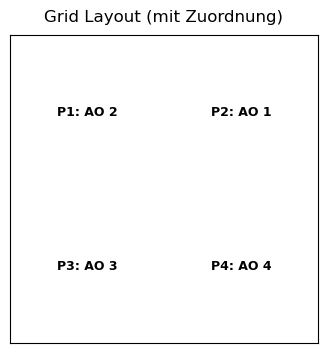

In [9]:
# QAP-Modell für die gegebene Instanz bauen (60 s Zeitlimit als Sicherheitsgrenze)
model, x = build_qap_scip(layout, timelimit=60)

# Optimierung starten
model.optimize()

print("Ergebnis")
print("---------------------------")
# Lösungsstatus ausgeben (z. B. 'optimal', 'timelimit', 'infeasible', ...)
print("SCIP-Status:", model.getStatus())

# Zielfunktionswert (minimale Gesamtkosten) ausgeben
obj_value = round(model.getObjVal(), 2)
print("Zielfunktionswert:", obj_value)

# Rechenzeit
print(f"Rechenzeit: {model.getSolvingTime():.2f} Sekunden")

# Zuordnung Objekt -> Position aus den binären Variablen x extrahieren
assignment = extract_assignment_scip(model, x)
print("Zuordnung (Objekt → Position):", {i+1: k+1 for i, k in assignment.items()})

# Ohne Namen:
layout.plot_layout(assignment=assignment)

## Teil 3: Lösung des QAP mit dem Zweiertauschverfahren

### Schritt 1: Implementieren des Zweiertauschverfahrens

Neben der exakten Lösung mit SCIP wollen wir das QAP nun, wie in der Vorlesung gezeigt, **heuristisch** lösen.  
Dazu verwenden wir ein einfaches **Zweiertauschverfahren**:

1. Starte mit einer Anfangszuordnung (hier: Objekt *i* → Position *i*).  
2. Tausche schrittweise die Positionen zweier Objekte $(i, j)$.  
3. Berechne die neuen Kosten und die **Einsparung** gegenüber der aktuellen Lösung.  
4. Führe den **besten Tausch** aus, falls er die Kosten reduziert.  
5. Wiederhole, bis keine Verbesserung mehr möglich ist oder die maximale Anzahl der Iterationen `max_iter` erreicht ist.  

Nach jeder Iteration wird eine Tabelle ausgegeben, die alle geprüften Tauschoptionen  
und ihre Einsparungen zeigt – einschließlich der Information, welcher Tausch letztlich durchgeführt wurde.

Zusätzlich definieren wir eine Funktion, mit der sich der **Kostenverlauf über die Iterationen** hinweg darstellen lässt.  
So können wir den Fortschritt des heuristischen Suchverfahrens visuell nachvollziehen.

In [10]:
def loese_mit_zweitertausch(instance, max_iter=10):
    """
    Zweiertauschverfahrens für das QAP.

    Ablauf je Iteration:
      - Probiere alle Objektpaare (i<j) aus (hypothetischer Swap).
      - Berechne neue Kosten und Einsparung.
      - Wähle den besten Swap (größte positive Einsparung).
      - Beende, wenn keine Verbesserung mehr möglich ist.

    Rückgabe:
      assignment_dict : {Objekt i -> Position k}
      best_cost       : beste gefundene Kosten
      history         : Kosten nach jeder angenommenen Verbesserung (Startwert inklusive)
    """
    n = instance.n_objects

    # Start: deterministische Identität (Objekt i -> Position i)
    pos = list(range(n))

    def qap_cost(inst, assignment):
        """Berechnet die Gesamtkosten einer gegebenen Zuordnung."""
        H = inst.flow_matrix[:n, :n]
        D = inst.distance_matrix
        return float(sum(H[i, j] * D[assignment[i], assignment[j]] for i in range(n) for j in range(n)))

    best_cost = qap_cost(instance, pos)
    history = [best_cost]
    print(f"Startkosten: {best_cost:.2f} | Startzuordnung: {pos}")

    time_history = [] # cumulative time taken after each iteration

    # --- Hauptschleife über Iterationen ---------------------------------------
    start_ime = perf_counter()
    for it in range(1, max_iter + 1):
        rows = []

        # Alle Paare (i<j) hypothetisch tauschen und bewerten
        for i in range(n - 1):
            for j in range(i + 1, n):
                pos_swapped = pos.copy()
                pos_swapped[i], pos_swapped[j] = pos_swapped[j], pos_swapped[i]
                new_cost = qap_cost(instance, pos_swapped)
                saving = best_cost - new_cost  # > 0 ⇒ Verbesserung

                rows.append({
                    "Iter": it,
                    "Tausch (i,j)": f"({i+1},{j+1})",
                    "Kosten neu": new_cost,
                    "Einsparung": saving
                })

        # Ausgabe der geprüften Swaps, sortiert nach Einsparung (absteigend)
        df = pd.DataFrame(rows).sort_values("Einsparung", ascending=False, ignore_index=True)
        print("\n--- Iteration", it, "---")
        print(df.to_string(index=False, formatters={
            "Kosten neu": lambda v: f"{v:.2f}",
            "Einsparung": lambda v: f"{v:.2f}"
        }))

        # Bester Swap? (Best-Improvement); Abbruch wenn keine Verbesserung
        if df.empty or df.loc[0, "Einsparung"] <= 1e-9:
            print("Keine Verbesserung mehr gefunden – Abbruch.")
            break

        # Besten Swap anwenden
        best_pair_str = df.loc[0, "Tausch (i,j)"]
        i_str, j_str = best_pair_str.strip("()").split(",")
        i_best, j_best = int(i_str) - 1, int(j_str) - 1

        pos[i_best], pos[j_best] = pos[j_best], pos[i_best]
        best_cost = float(df.loc[0, "Kosten neu"])
        history.append(best_cost)

        print(f"→ Gewählt: Tausch {best_pair_str}. Neue Kosten: {best_cost:.2f}")
        time_history.append(perf_counter() - start_ime)

    # Zuordnung als Dict zurück
    assignment_dict = {i: int(pos[i]) for i in range(n)}
    print(f"\nEnde nach {len(history)-1} Verbesserungen. Beste Kosten: {best_cost:.2f}")

    return assignment_dict, best_cost, history, time_history

def plot_kostenverlauf(history):
    """
    Zeichnet den Kostenverlauf der 2er-Tausch-Heuristik.
    X-Achse: Iterationen, Y-Achse: Zielfunktionswert.
    """
    plt.figure(figsize=(6, 4))
    plt.plot(range(len(history)), history, marker="o", linewidth=1.5)
    plt.title("Kostenverlauf der 2er-Tausch-Heuristik")
    plt.xlabel("Iteration")
    plt.ylabel("Kosten")
    plt.grid(True, linestyle="--", linewidth=0.5)
    plt.tight_layout()
    plt.show()


### Schritt 2: Anwendung des Zweiertauschverfahrens auf die Beispielinstanz

Nun wenden wir das **Zweiertauschverfahrens** auf unsere Beispielinstanz aus der Vorlesung an.  
Wir sehen, dass die nach einer Iteration gefundene Lösung bereits nicht mehr verbessert werden kann.


Startkosten: 830.00 | Startzuordnung: [0, 1, 2, 3]

--- Iteration 1 ---
 Iter Tausch (i,j) Kosten neu Einsparung
    1        (1,2)     600.00     230.00
    1        (3,4)     600.00     230.00
    1        (1,3)     690.00     140.00
    1        (2,4)     690.00     140.00
    1        (1,4)     830.00       0.00
    1        (2,3)     830.00       0.00
→ Gewählt: Tausch (1,2). Neue Kosten: 600.00

--- Iteration 2 ---
 Iter Tausch (i,j) Kosten neu Einsparung
    2        (1,3)     600.00       0.00
    2        (2,4)     600.00       0.00
    2        (1,4)     690.00     -90.00
    2        (2,3)     690.00     -90.00
    2        (1,2)     830.00    -230.00
    2        (3,4)     830.00    -230.00
Keine Verbesserung mehr gefunden – Abbruch.

Ende nach 1 Verbesserungen. Beste Kosten: 600.00


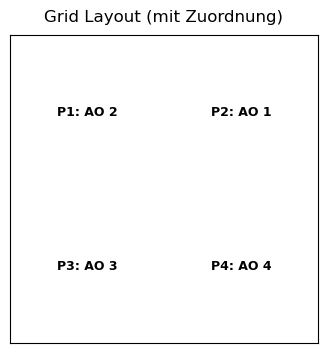

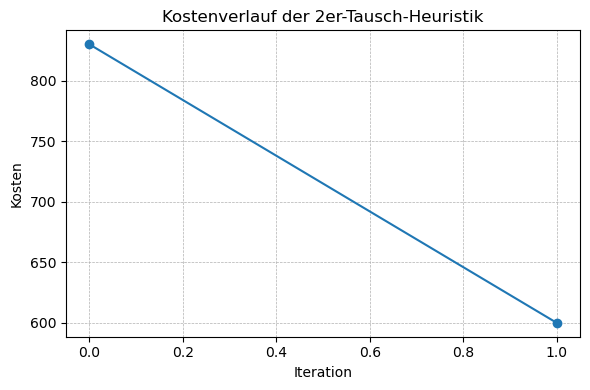


Heuristische Zuordnung (Objekt → Position): {1: 2, 2: 1, 3: 3, 4: 4}
Endkosten der Heuristik: 600.00


In [12]:
# 2er-Tausch-Heuristik auf die Beispielinstanz anwenden
assignment_heur, cost_heur, hist, time_history = loese_mit_zweitertausch(layout, max_iter=10)

# Ergebnis-Layout mit Zuordnung anzeigen
layout.plot_layout(assignment=assignment_heur)

# Kostenverlauf visualisieren
plot_kostenverlauf(hist)

# Ergebnis ausgeben
print("\nHeuristische Zuordnung (Objekt → Position):", {i+1:k+1 for i,k in assignment_heur.items()})
print(f"Endkosten der Heuristik: {cost_heur:.2f}")

### Schritt 3: Lösen einer größeren, zufällig generierten Beispielinstanz

Damit wir an einem Beispiel sehen können, wie sich der Zielfunktionswert bei einer Probleminstanz über mehrere Iterationen verbessert, erzeugen wir eine weitere Probleminstanz mit mehreren Anordnungsobjekten und lösen diese mit dem Zweiertauschverfahren. 

Startkosten: 181030.00 | Startzuordnung: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

--- Iteration 1 ---
 Iter Tausch (i,j) Kosten neu Einsparung
    1       (8,14)  175230.00    5800.00
    1       (7,13)  175610.00    5420.00
    1       (7,14)  176310.00    4720.00
    1       (1,14)  176910.00    4120.00
    1        (5,8)  176990.00    4040.00
    1       (5,11)  177090.00    3940.00
    1       (3,14)  177290.00    3740.00
    1       (1,11)  177390.00    3640.00
    1       (4,14)  177430.00    3600.00
    1        (1,7)  177640.00    3390.00
    1        (1,9)  177950.00    3080.00
    1        (8,9)  178050.00    2980.00
    1       (1,10)  178130.00    2900.00
    1        (1,6)  178190.00    2840.00
    1       (7,11)  178190.00    2840.00
    1       (4,13)  178250.00    2780.00
    1      (12,13)  178410.00    2620.00
    1       (8,16)  178430.00    2600.00
    1       (4,10)  178550.00    2480.00
    1       (7,12)  178570.00    2460.00
    1      (11,14)  17

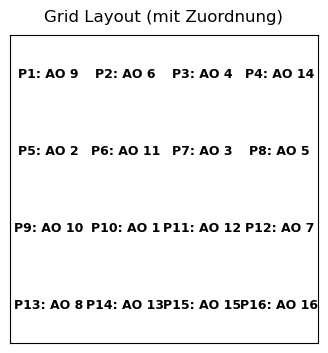

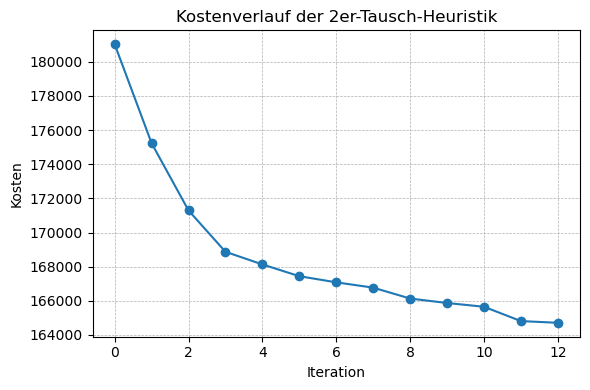


Heuristische Zuordnung (Objekt → Position): {1: 10, 2: 5, 3: 7, 4: 3, 5: 8, 6: 2, 7: 12, 8: 13, 9: 1, 10: 9, 11: 6, 12: 11, 13: 14, 14: 4, 15: 15, 16: 16}
Endkosten der Heuristik: 164710.00


In [15]:
# Zufällige Instanz mit mehr Objekten (z. B. 14) erzeugen
layout = QAPInstance(n_objects=16, seed=42)

# 2er-Tausch-Heuristik auf die Beispielinstanz anwenden
assignment_heur, cost_heur, hist, time_history = loese_mit_zweitertausch(layout, max_iter=20)

# Ergebnis-Layout mit Zuordnung anzeigen
layout.plot_layout(assignment=assignment_heur)

# Kostenverlauf visualisieren
plot_kostenverlauf(hist)

# Ergebnis ausgeben
print("\nHeuristische Zuordnung (Objekt → Position):", {i+1:k+1 for i,k in assignment_heur.items()})
print(f"Endkosten der Heuristik: {cost_heur:.2f}")

## Teil 4: Vergleich beider Ansätze (SCIP vs. Zweiertauschverfahren)

### Schritt 1: Benchmark — SCIP vs. Zweiertauschverfahren

Zum Abschluss vergleichen wir die beiden Lösungsverfahren:  
den **exakten MIP-Solver SCIP** und das **heuristische Zweiertauschverfahren**.

Dabei betrachten wir zwei Leistungskennzahlen:
1. **Rechenzeit** – Wie lange dauert es, bis eine Lösung gefunden wird?  
2. **Zielfunktionswert** – Wie gut ist die gefundene Lösung im Vergleich zum Optimum, bzw. -wenn wir das Optimum nicht kennen- zur besten uns bekannten Lösung? 

Da SCIP ein **exaktes Verfahren** ist, rechnen wir mit einem **Zeitlimit von 120 Sekunden**, damit der Solver bei größeren Instanzen nicht unendlich lange weiterläuft.

Zur Vergleichbarkeit erzeugen wir mit unserem Instanzgenerator eine Reihe zufälliger Instanzen unterschiedlicher Größe:  
$\{4, 9, 16, 25, 36, 49\}$ Anordnungsobjekte.

Für jede Problemgröße werden **drei zufällige Instanzen** generiert, also insgesamt $6 \times 3 = 18$ Testinstanzen.  
Jede dieser Instanzen lösen wir
- mit **SCIP** (Zeitlimit 120 s) und  
- mit dem **Zweiertauschverfahren** mit maximal 10, 20, und 50 Verbesserungsiterationen(*).

Die Ergebnisse werden anschließend hinsichtlich Rechenzeit und Zielfunktionswert verglichen.

(*) Damit wir die ersten 10 bzw. 20 Iterationen des Zweiertauschverfahrens nicht unnötig wiederholen, führen wir das Verfahren nur einmal mit maximal 50 Iterationen aus und lesen uns anschließend die Zielfunktionswerte nach 10 bzw. 20 Iterationen über die Historie aus.

In [16]:
def experiment(list_n_objects, n_samples, timelimit_scip):
    """
    Führt einen einfachen Benchmark für SCIP vs. Zweiertausch durch.

    Args:
        list_n_objects (list[int]): Problemgrößen, z. B. [4, 9, 16, 25, 36, 49]
        n_samples (int): Anzahl Zufallsinstanzen pro Größe (z. B. 3)
        timelimit_scip (float): Zeitlimit für SCIP in Sekunden

    Returns:
        pandas.DataFrame: Eine Zeilen pro Instanz mit Zeiten/Zielen beider Verfahren.
    """
    results = []
    for n_objects in list_n_objects:
        for s in range(n_samples):
            # Instanz erzeugen (Zufallsflüsse, Grid gemäß Klasse)
            layout = QAPInstance(n_objects=n_objects, seed=s)

            print(f"\n--- Experiment: n_objects={n_objects}, Sample={s+1} ---")

            # ------------------ SCIP: Modell bauen & lösen ------------------
            model, x = build_qap_scip(layout, timelimit=timelimit_scip)
            start_time = perf_counter()
            model.optimize()
            scip_time = perf_counter() - start_time

            scip_status = model.getStatus()  # i. d. R. Enum/Objekt; str()-Darstellung beim Print ok

            # Zielfunktionswert: versuche besten bekannten Wert zu lesen (auch bei timelimit)
            try:
                scip_obj = float(model.getObjVal())
            except Exception:
                scip_obj = None  # keine Lösung verfügbar

            # Optional: relativer Gap (falls unterstützt)
            try:
                scip_gap = float(model.getGap())
            except Exception:
                scip_gap = None

            print(f"SCIP: Status={scip_status}, "
                  f"Zielfunktionswert={('—' if scip_obj is None else f'{scip_obj:.2f}')}, "
                  f"Zeit={scip_time:.2f}s")

            # --------------- Heuristik: Zweiertauschverfahren ---------------
            start_time = perf_counter()
            assignment_heur, cost_heur, hist, time_history = loese_mit_zweitertausch(layout, max_iter=50)
            heur_time = perf_counter() - start_time

            print(f"Zweiertausch: Zielfunktionswert={cost_heur:.2f}, Zeit={heur_time:.2f}s")

            # ---------------------------- Log --------------------------------
            results.append({
                "n_objects": n_objects,
                "sample": s + 1,
                # SCIP
                "scip_status": str(scip_status),
                "scip_obj": scip_obj,
                "scip_time": scip_time,
                "scip_gap": scip_gap,
                # Heuristik
                "heur_obj_10_iter": hist[9] if len(hist) > 10 else cost_heur, # if heuristic terminated earlier
                "heur_time_10_iter": time_history[9] if len(time_history) > 10 else heur_time,
                "heur_obj_20_iter": hist[19] if len(hist) > 20 else cost_heur, # if heuristic terminated earlier
                "heur_time_20_iter": time_history[19] if len(time_history) > 20 else heur_time,
                "heur_obj_50_iter": cost_heur, 
                "heur_time_50_iter": heur_time
            })

    return pd.DataFrame(results)

results = experiment(list_n_objects = [4, 9, 16, 25, 36, 49], n_samples = 3, timelimit_scip = 120)

print("Experiment beendet.")


--- Experiment: n_objects=4, Sample=1 ---
SCIP: Status=optimal, Zielfunktionswert=3920.00, Zeit=0.36s
Startkosten: 4080.00 | Startzuordnung: [0, 1, 2, 3]

--- Iteration 1 ---
 Iter Tausch (i,j) Kosten neu Einsparung
    1        (1,2)    3920.00     160.00
    1        (3,4)    3920.00     160.00
    1        (1,4)    4080.00       0.00
    1        (2,3)    4080.00       0.00
    1        (1,3)    4600.00    -520.00
    1        (2,4)    4600.00    -520.00
→ Gewählt: Tausch (1,2). Neue Kosten: 3920.00

--- Iteration 2 ---
 Iter Tausch (i,j) Kosten neu Einsparung
    2        (1,3)    3920.00       0.00
    2        (2,4)    3920.00       0.00
    2        (1,2)    4080.00    -160.00
    2        (3,4)    4080.00    -160.00
    2        (1,4)    4600.00    -680.00
    2        (2,3)    4600.00    -680.00
Keine Verbesserung mehr gefunden – Abbruch.

Ende nach 1 Verbesserungen. Beste Kosten: 3920.00
Zweiertausch: Zielfunktionswert=3920.00, Zeit=0.00s

--- Experiment: n_objects=4, Sample

#### Relativer Vergleich der Zielfunktionswerte

Wir wollen nun die durchschnittliche *prozentuale Abweichung* der Zielfunktionswerte verschiedener Algorithmen vom jeweils besten Wert pro Probleminstanz bestimmen.  
So können wir beurteilen, wie gut die einzelnen Verfahren im Vergleich abschneiden.


In [17]:
# --- Mittelwerte der prozentualen Abweichung je Problemgröße berechnen -----------------------------

# Liste der Algorithmen (entsprechend den Spaltennamen in 'results')
alg_cols = [
    "scip_obj",
    "heur_obj_10_iter",
    "heur_obj_20_iter",
    "heur_obj_50_iter",
]

# Kopie des Datensatzes
df = results.copy()

# 1) Bestwert pro Instanz (über alle Algorithmen hinweg)
#    → Für jede Instanz wird der kleinste Zielfunktionswert bestimmt
best_per_row = df[alg_cols].min(axis=1)

# 2) Prozentuale Lücken je Algorithmus und Instanz berechnen:
#    (Zielfunktionswert - Bestwert) / Bestwert * 100
#    → Misst, wie weit ein Algorithmus im Durchschnitt vom besten Wert entfernt ist
gaps_pct = (
    df[alg_cols]
    .sub(best_per_row, axis=0)                      # Differenz zum Bestwert
    .div(best_per_row.replace(0, np.nan), axis=0)   # Division durch Bestwert (robust gegen 0)
    * 100                                           # Umrechnung in Prozent
).replace([np.inf, -np.inf], np.nan)                # Unendlichkeiten durch NaN ersetzen

# 3) Durchschnittliche Abweichungen je Problemgröße berechnen
#    → Gruppierung nach 'n_objects' und Mittelwert der Abweichungen
summary_gap_pct = (
    pd.concat([df["n_objects"], gaps_pct], axis=1)
    .groupby("n_objects", as_index=False)
    .mean()
    .rename(columns={c: c + "_gap_pct" for c in alg_cols})
)

# 4) Ausgabe der zusammengefassten Ergebnisse
display(summary_gap_pct)

,n_objects,scip_obj_gap_pct,heur_obj_10_iter_gap_pct,heur_obj_20_iter_gap_pct,heur_obj_50_iter_gap_pct
0,4,0.000000,0.000000,0.000000,0.000000
1,9,0.008747,0.337048,0.337048,0.337048
2,16,2.370762,0.042740,0.000000,0.000000
3,25,3.437290,1.210269,0.028656,0.000000
4,36,NaN,1.586852,0.397559,0.000000
5,49,NaN,1.823642,0.682709,0.000000


#### Absoluter Vergleich der Rechenzeiten

Im Folgenden berechnen wir die **durchschnittliche Rechenzeit** für jedes Verfahren 
(SCIP und die Heuristik mit 10, 20 und 50 Iterationen) getrennt nach Problemgröße.  
So können wir analysieren, wie stark die Rechenzeit jeweils mit der Anzahl der Anordnungsobjekte steigt.

In [18]:
# --- Durchschnittliche Rechenzeiten je Verfahren und Problemgröße -----------------------------

# Spaltennamen der Rechenzeiten
time_cols = [
    "scip_time",
    "heur_time_10_iter",
    "heur_time_20_iter",
    "heur_time_50_iter",
]

# Durchschnittliche Zeiten pro Problemgröße (n_objects)
summary_time = (
    results
    .groupby("n_objects", as_index=False)[time_cols]
    .mean()
)

display(summary_time)


,n_objects,scip_time,heur_time_10_iter,heur_time_20_iter,heur_time_50_iter
0,4,0.684228,0.005120,0.005120,0.005120
1,9,119.552629,0.028041,0.028041,0.028041
2,16,119.384616,0.376097,0.376097,0.376097
3,25,119.944409,2.290364,4.487965,4.646826
4,36,119.381513,9.447780,18.963617,29.291542
5,49,161.272236,26.845936,49.341639,106.368208


#### Visualisierung der Ergebnisse

Im folgenden werden die durchschnittlichen Rechenzeiten sowie die durchschnittlichen
prozentualen Abweichungen der verschiedenen Algorithmen dargestellt.

- Der erste Plot zeigt, wie die Rechenzeit mit der Problemgröße zunimmt.  
- Der zweite Plot zeigt, wie nahe die Lösungen der Heuristik an den besten gefundenen Wert herankommen.

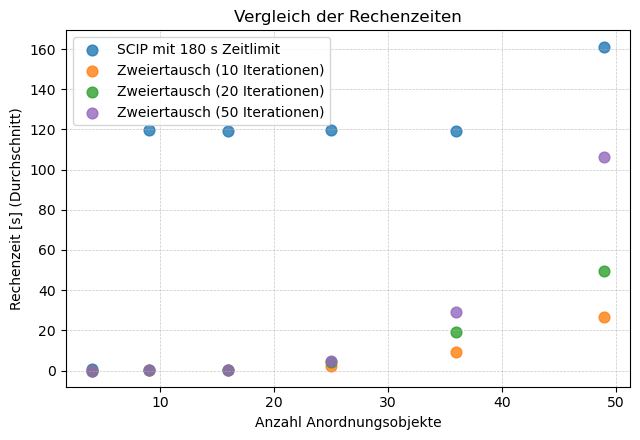

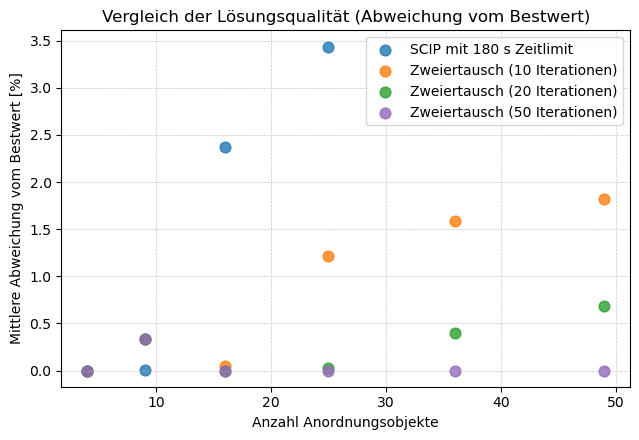

In [19]:

# === 1) Scatterplot: Rechenzeit vs. Problemgröße =======================================
plt.figure(figsize=(6.5, 4.5))

plt.scatter(summary_time["n_objects"], summary_time["scip_time"],
            color="tab:blue", label="SCIP mit 180 s Zeitlimit", s=60, alpha=0.8)

plt.scatter(summary_time["n_objects"], summary_time["heur_time_10_iter"],
            color="tab:orange", label="Zweiertausch (10 Iterationen)", s=60, alpha=0.8)

plt.scatter(summary_time["n_objects"], summary_time["heur_time_20_iter"],
            color="tab:green", label="Zweiertausch (20 Iterationen)", s=60, alpha=0.8)

plt.scatter(summary_time["n_objects"], summary_time["heur_time_50_iter"],
            color="tab:purple", label="Zweiertausch (50 Iterationen)", s=60, alpha=0.8)

plt.xlabel("Anzahl Anordnungsobjekte")
plt.ylabel("Rechenzeit [s] (Durchschnitt)")
plt.title("Vergleich der Rechenzeiten")
plt.legend()
plt.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()

# === 2) Scatterplot: Durchschnittliche Abweichung vom Bestwert =====================================
plt.figure(figsize=(6.5, 4.5))

plt.scatter(summary_gap_pct["n_objects"], summary_gap_pct["scip_obj_gap_pct"],
            color="tab:blue", label="SCIP mit 180 s Zeitlimit", s=60, alpha=0.8)

plt.scatter(summary_gap_pct["n_objects"], summary_gap_pct["heur_obj_10_iter_gap_pct"],
            color="tab:orange", label="Zweiertausch (10 Iterationen)", s=60, alpha=0.8)

plt.scatter(summary_gap_pct["n_objects"], summary_gap_pct["heur_obj_20_iter_gap_pct"],
            color="tab:green", label="Zweiertausch (20 Iterationen)", s=60, alpha=0.8)

plt.scatter(summary_gap_pct["n_objects"], summary_gap_pct["heur_obj_50_iter_gap_pct"],
            color="tab:purple", label="Zweiertausch (50 Iterationen)", s=60, alpha=0.8)

plt.xlabel("Anzahl Anordnungsobjekte")
plt.ylabel("Mittlere Abweichung vom Bestwert [%]")
plt.title("Vergleich der Lösungsqualität (Abweichung vom Bestwert)")
plt.legend()
plt.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)
plt.tight_layout()
plt.show()

#### Reflexion: Interpretation der Ergebnisse

Diskutieren Sie untereinander:

1. **Laufzeiten:**  
   Wie verändert sich die Rechenzeit von SCIP und dem Zweiertauschverfahren mit wachsender Problemgröße?  
   Erkennen Sie einen Trend? Was ändert sich, wenn Sie das Timelimit von SCIP oder die Anzahl an Iterationen des Verfahrens verändern?

2. **Lösungsqualität:**  
   Wie unterscheiden sich die Zielfunktionswerte der beiden Verfahren? Ändert sich der Unterschied mit zunehmender Problemgröße?
  
3. **Zeit–Qualitäts-Abwägung:**  
   Wie würden Sie ein „gutes Gleichgewicht“ zwischen Qualität und Laufzeit beschreiben?